# Time Series Analysis

In [75]:
# Import necessary libraries for data analysis and modeling

import os  # Operating system-related functions
import pandas as pd  # Data manipulation and analysis library
import numpy as np  # Numerical computing library
from datetime import datetime  # Handling date and time data
import matplotlib.pyplot as plt  # Data visualization library
import seaborn as sns  # Data visualization library with a focus on aesthetics
from sklearn.preprocessing import MinMaxScaler  # Data preprocessing for feature scaling

# All necessary Plotly libraries for interactive data visualization
import plotly as plotly
import plotly.io as plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots


# Stats tools for statistical analysis
from statsmodels.tsa.stattools import adfuller  # Augmented Dickey-Fuller test for time series stationarity
from statsmodels.tsa.seasonal import seasonal_decompose  # Seasonal decomposition of time series data

# Metrics for model evaluation
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score # Common metrics for evaluating model performance

# Deep learning library for building and training neural networks
from tensorflow import keras
from tensorflow.keras.layers import Dense, LSTM
from tensorflow.keras import Sequential

# joblib to save the created ML model
import joblib


In [38]:
# Read the contents of a CSV file ('SPX.csv') and store it in a Pandas DataFrame 'df'
df = pd.read_csv('archive\SPX.csv')


**Dataset** SPX.csv includes all the historical data of S&P 500 index from 1927 to 2020 with the date, opening price, highest price, lowest price, closing price, adjusted closing price( after all applicable splits and dividend distributions), and the number of shares traded of the day as columns

Date: The date of the stock market data.

Open: The opening price of the stock on that date.

High: The highest price the stock reached during that day.

Low: The lowest price the stock reached during that day.

Close: The closing price of the stock on that date.

Adj Close: The adjusted closing price of the stock on that date. Adjusted closing prices are used to account for events such as dividends, stock splits, and new stock offerings.

Volume: The trading volume, which represents the number of shares of the stock traded on that da

In [77]:
# Display the first few rows of the DataFrame 'df' to inspect the data
df.head()


,Date,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
1927-12-30,1927-12-30,17.660000,17.660000,17.660000,17.660000,17.660000,0
1928-01-03,1928-01-03,17.760000,17.760000,17.760000,17.760000,17.760000,0
1928-01-04,1928-01-04,17.719999,17.719999,17.719999,17.719999,17.719999,0
1928-01-05,1928-01-05,17.549999,17.549999,17.549999,17.549999,17.549999,0
1928-01-06,1928-01-06,17.660000,17.660000,17.660000,17.660000,17.660000,0


In [40]:
# Display the last few rows of the DataFrame 'df' to inspect the end of the data
df.tail()


,Date,Open,High,Low,Close,Adj Close,Volume
23318,2020-10-29,3277.169922,3341.050049,3259.820068,3310.110107,3310.110107,4903070000
23319,2020-10-30,3293.590088,3304.929932,3233.939941,3269.959961,3269.959961,4840450000
23320,2020-11-02,3296.199951,3330.139893,3279.739990,3310.239990,3310.239990,4310590000
23321,2020-11-03,3336.250000,3389.489990,3336.250000,3369.159912,3369.159912,4220070000
23322,2020-11-04,3406.459961,3486.250000,3405.169922,3443.439941,3443.439941,4783040000


In [41]:
# Convert the 'Date' column to datetime data type in the DataFrame 'df'
df['Date'] = pd.to_datetime(df['Date'])


In [42]:
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1927-12-30,17.660000,17.660000,17.660000,17.660000,17.660000,0
1,1928-01-03,17.760000,17.760000,17.760000,17.760000,17.760000,0
2,1928-01-04,17.719999,17.719999,17.719999,17.719999,17.719999,0
3,1928-01-05,17.549999,17.549999,17.549999,17.549999,17.549999,0
4,1928-01-06,17.660000,17.660000,17.660000,17.660000,17.660000,0


In [43]:
# Set the DataFrame 'df' index to the 'Date' column and sort the DataFrame by the index
df = df.set_index(df['Date']).sort_index()

# Print the shape (dimensions) of the DataFrame
print(df.shape)

# Display a random sample of 5 rows from the DataFrame
df.sample(5)


(23323, 7)


,Date,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
1935-10-16,1935-10-16,11.720000,11.720000,11.720000,11.720000,11.720000,0
2007-06-05,2007-06-05,1539.119995,1539.119995,1525.619995,1530.949951,1530.949951,2939450000
1931-06-23,1931-06-23,14.410000,14.410000,14.410000,14.410000,14.410000,0
1971-02-16,1971-02-16,98.430000,99.589996,97.849998,98.660004,98.660004,21350000
1928-12-12,1928-12-12,22.520000,22.520000,22.520000,22.520000,22.520000,0


In [44]:
# Display information about the DataFrame 'df'
df.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 23323 entries, 1927-12-30 to 2020-11-04
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       23323 non-null  datetime64[ns]
 1   Open       23323 non-null  float64       
 2   High       23323 non-null  float64       
 3   Low        23323 non-null  float64       
 4   Close      23323 non-null  float64       
 5   Adj Close  23323 non-null  float64       
 6   Volume     23323 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 1.4 MB


<Axes: xlabel='Date'>

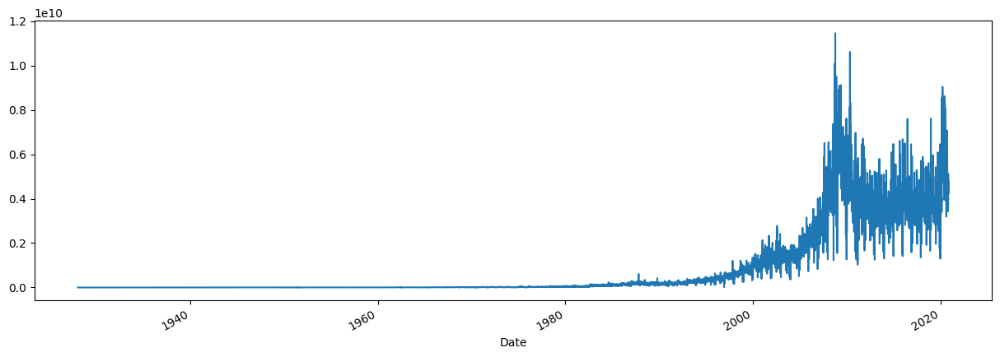

In [45]:
# Create a line plot of the 'Volume' column from the DataFrame 'df' with a custom figure size
df['Volume'].plot(figsize=(15, 5))


In [46]:
# Filter the DataFrame 'df' to select rows where the 'Volume' is greater than zero
data = df[df['Volume'] > 0]

# Display the first few rows of the filtered DataFrame 'data'
data.head()


,Date,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
1950-01-03,1950-01-03,16.66,16.66,16.66,16.66,16.66,1260000
1950-01-04,1950-01-04,16.85,16.85,16.85,16.85,16.85,1890000
1950-01-05,1950-01-05,16.93,16.93,16.93,16.93,16.93,2550000
1950-01-06,1950-01-06,16.98,16.98,16.98,16.98,16.98,2010000
1950-01-09,1950-01-09,17.08,17.08,17.08,17.08,17.08,2520000


<Axes: xlabel='Date'>

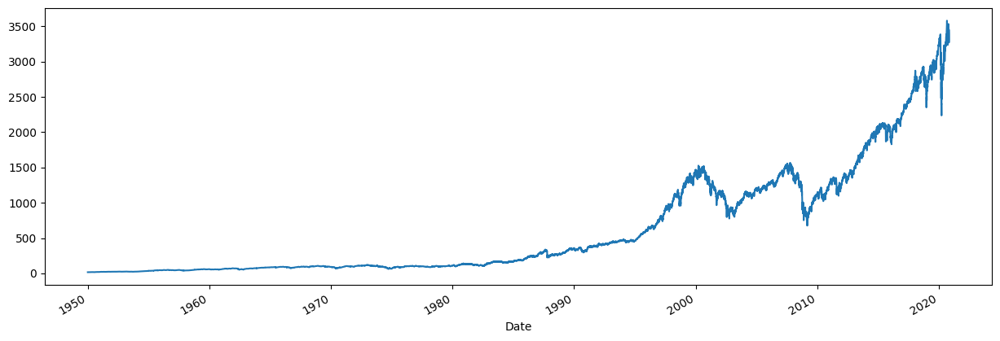

In [47]:
# Create a line plot of the 'Close' column from the 'data' DataFrame with a custom figure size
data['Close'].plot(figsize=(15, 5))


<Axes: xlabel='Close', ylabel='Density'>

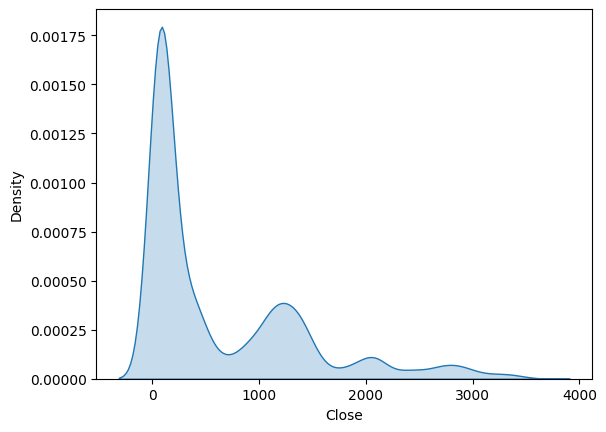

In [48]:
# Create a Kernel Density Estimate (KDE) plot for the 'Close' column in the 'data' DataFrame with filled areas
sns.kdeplot(data['Close'], fill=True)


In [49]:
# Calculate and add a 'Return' column to 'data' representing the return on investment (ROI)
data['Return'] = (data['Adj Close'] - data['Open']) / data['Open']

# Create a copy of the 'data' DataFrame and store it in 'stocks_data' for later use
stocks_data = data.copy()


C:\Users\user\AppData\Local\Temp\ipykernel_14556\2499380382.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [50]:
# Create an interactive line plot for the 'Close' column against the 'Date' column
# with a title and the option to use a range slider and time selectors
fig = px.line(data, x="Date", y="Close", title="Closing Price: Range Slider and Selectors")

# Enable the range slider for adjusting the time range
# Configure rangeselector buttons for customizing the time period
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)


In [51]:
# Create an interactive line plot for the 'Return' column against the 'Date' column
# with a title and the option to use a range slider and time selectors
fig = px.line(data, x="Date", y="Return", title="Returns: Range Slider and Selectors")

# Enable the range slider for adjusting the time range
# Configure rangeselector buttons for customizing the time period
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)


In [52]:
# Create a Candlestick chart to visualize the price data over time
fig = go.Figure(data=[go.Candlestick(
    x=data['Date'],
    open=data['Open'],
    high=data['High'],
    low=data['Low'],
    close=data['Close']
)])

# Display the Candlestick chart
fig.show()


In [53]:
# Create a subplot with two rows and one column
fig = make_subplots(rows=2, cols=1)

# Add an OHLC (Open-High-Low-Close) plot to the first row of the subplot
fig.add_trace(go.Ohlc(x=data.Date, open=data.Open, high=data.High, low=data.Low, close=data.Close, name='Price'), row=1, col=1)

# Add a scatter plot representing the 'Volume' data to the second row of the subplot
fig.add_trace(go.Scatter(x=data.Date, y=data.Volume, name='Volume'), row=2, col=1)

# Update the layout to hide the x-axis range slider
fig.update(layout_xaxis_rangeslider_visible=False)

# Display the subplot
fig.show()


# Time Series Data Analysis - Resampling

In time series analysis, maintaining data consistency is crucial, and resampling serves as a vital technique to achieve this. It ensures that time series data is uniformly distributed with a consistent frequency. More importantly, resampling offers a different perspective on the data, often revealing additional insights.

**Upsampling** - This technique involves resampling a time series from a lower frequency to a higher one, such as from monthly to daily frequency. In this process, the missing data points are typically filled or interpolated, ensuring a more granular view of the data.

**Downsampling** - In contrast, downsampling entails resampling a time series from a higher frequency to a lower one, for example, from weekly to monthly frequency. The primary objective here is to aggregate the existing data, summarizing it at the lower frequency.

In essence, resampling allows us to adapt the time series data to various timeframes, uncovering hidden patterns and facilitating a more in-depth analysis.


In [54]:
# Resample the 'data' DataFrame annually and calculate the maximum values within each year
# Display the last 5 periods
data.resample(rule='A').max().tail(5)


,Date,Open,High,Low,Close,Adj Close,Volume,Return
Date,,,,,,,,
2016-12-31,2016-12-30,2270.540039,2277.530029,2266.149902,2271.719971,2271.719971,7597450000,0.024414
2017-12-31,2017-12-29,2692.709961,2694.969971,2685.919922,2690.159912,2690.159912,5723920000,0.008097
2018-12-31,2018-12-31,2936.760010,2940.909912,2927.110107,2930.750000,2930.750000,7609010000,0.044255
2019-12-31,2019-12-31,3247.229980,3247.929932,3234.370117,3240.020020,3240.020020,6454270000,0.023283
2020-12-31,2020-11-04,3564.739990,3588.110107,3535.229980,3580.840088,3580.840088,9044690000,0.054876


<Axes: xlabel='Date'>

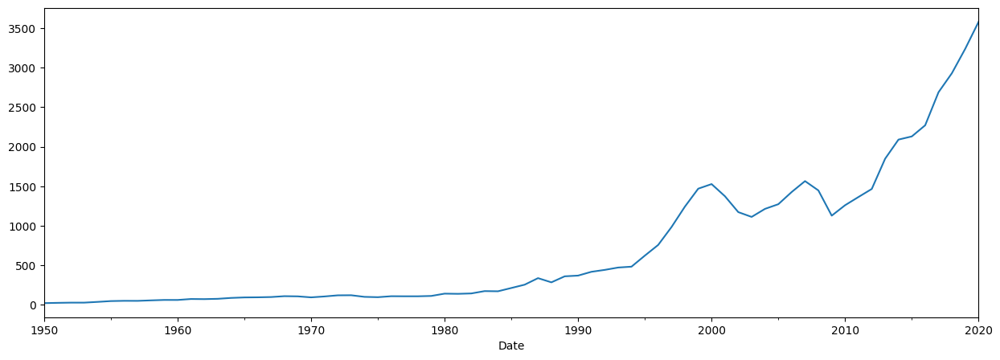

In [55]:
# Resample the 'Close' column of 'data' annually and calculate the maximum closing price for each year
# Create a line plot of the maximum closing prices with a custom figure size
data['Close'].resample(rule='A').max().plot(figsize=(15, 5))


**Technical Indicators**

Technical indicators play a vital role in visualizing stock price patterns.

In this article, we will explore a set of technical indicators that find extensive use among experts and researchers, particularly in the realm of automated trading. The featured indicators include:

1. Fast and Slow Simple Moving Averages.
2. Fast and Slow Exponential Moving Averages.


**Simple Moving Average (SMA)**

* The Simple Moving Average, or SMA, stands as a widely used technical indicator.
* SMA computes the average of stock prices over a specified time period, aiding in trend analysis.
* As described, we will establish both a slow SMA (SMA_15) and a fast SMA (SMA_5).
* These numeric values denote the time interval, for example, 15 days.

In [56]:
# Calculate Simple Moving Averages (SMA) for 5-day and 15-day intervals
data['SMA_5'] = data['Close'].rolling(5).mean().shift()
data['SMA_15'] = data['Close'].rolling(15).mean().shift()


C:\Users\user\AppData\Local\Temp\ipykernel_14556\1330719606.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_14556\1330719606.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [57]:
# Create a Plotly figure for visualizing SMA and closing prices within a specific date range
fig = go.Figure()

# Add traces for SMA_5, SMA_15, and Close prices
fig.add_trace(go.Scatter(x=data.Date, y=data.SMA_5, name='SMA_5'))
fig.add_trace(go.Scatter(x=data.Date, y=data.SMA_15, name='SMA_15'))
fig.add_trace(go.Scatter(x=data.Date, y=data.Close, name='Close', opacity=0.3))

# Show the figure
fig.show()


**Exponential Moving Average (EMA)**

* The Exponential Moving Average (EMA) is a variant of the moving average (MA) that assigns more weight and importance to recent data points.
* In simple terms, EMA gives greater significance to the most recent stock price data compared to older data, making it more responsive to recent price changes.

In [58]:
# Calculate Exponential Moving Averages (EMA) for 5-day and 15-day intervals
data['EMA_5'] = data['Close'].ewm(5).mean().shift()
data['EMA_15'] = data['Close'].ewm(15).mean().shift()


C:\Users\user\AppData\Local\Temp\ipykernel_14556\3887910410.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_14556\3887910410.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [59]:
# Create a Plotly figure for visualizing EMA and closing prices within a specific date range
fig = go.Figure()

# Add traces for EMA_5, EMA_15, and Close prices
fig.add_trace(go.Scatter(x=data.Date, y=data.EMA_5, name='EMA_5'))
fig.add_trace(go.Scatter(x=data.Date, y=data.EMA_15, name='EMA_15'))
fig.add_trace(go.Scatter(x=data.Date, y=data.Close, name='Close', opacity=0.3))

# Show the figure
fig.show()


In [60]:
# Create a Plotly figure to compare SMA_5, EMA_5, and Close prices within a specific date range
fig = go.Figure()

# Add traces for SMA_5, EMA_5, and Close prices
fig.add_trace(go.Scatter(x=data.Date, y=data.SMA_5, name='SMA_5'))
fig.add_trace(go.Scatter(x=data.Date, y=data.EMA_5, name='EMA_5'))
fig.add_trace(go.Scatter(x=data.Date, y=data.Close, name='Close', opacity=0.3))

# Show the figure
fig.show()

# EMA_5 appears to perform better than SMA_5 as it closely tracks the closing price of the stock.


**Time Series Decomposition**

Time series data can be broken down into its individual components, including trend, seasonality, and remainder. This decomposition can be represented as an additive or multiplicative combination of the base level, trend, seasonal index, and the residual component. To implement this decomposition, the 'seasonal_decompose' function in the 'statsmodels' library is utilized.

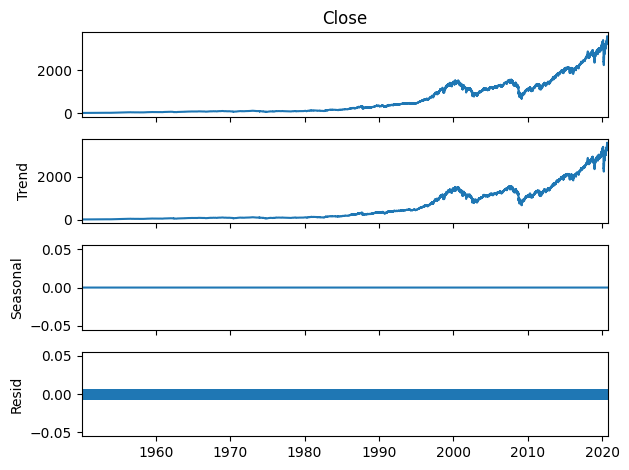

In [61]:
# Perform seasonal decomposition of the 'Close' series using an additive model
# The 'period' parameter is set to 1, indicating that the frequency is daily.
series = data.Close
result = seasonal_decompose(series, model='additive', period=1)

# Plot the decomposition results
figure = result.plot()


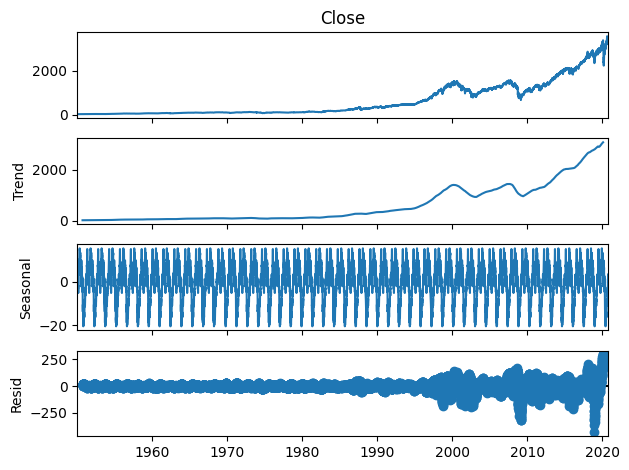

In [62]:
# Perform seasonal decomposition of the 'Close' series using an additive model
# The 'period' parameter is set to 365, indicating that the frequency is yearly.
series = data.Close
result = seasonal_decompose(series, model='additive', period=365)

# Plot the decomposition results
figure = result.plot()


* There is clearly an upward trend in the above plot.
* You can also see the uniform seasonal change.
* Non-uniform noise that represent outliers and missing values

**Stationary Test / ADF (Augmented Dickey-Fuller) Test**

In time series analysis, a stationary time series is one whose statistical properties, such as mean, variance, and autocorrelation, remain constant over time. Stationarity can be categorized as strong and weak:

- Strong stationarity implies that the unconditional joint probability distribution of the series remains constant when shifted in time. Consequently, parameters like mean and variance also do not change over time.
- Weak stationarity means that the mean, variance, and autocorrelation of the series remain constant throughout the time.

Stationarity is crucial because non-stationary series, which depend on time, introduce many parameters when modeling time series. The `diff()` method can be used to convert a non-stationary series into a stationary one.

To perform time series analysis effectively, it's essential to determine whether a series is stationary. The Augmented Dickey-Fuller (ADF) test is a widely used statistical test for this purpose. It helps in identifying the presence of a unit root in the series, indicating whether the series is stationary. The null and alternate hypotheses for this test are:

**Null Hypothesis**: The series has a unit root (value of alpha = 1).

**Alternate Hypothesis**: The series has no unit root.

If we fail to reject the null hypothesis, it implies that the series is non-stationary. This indicates that the series can be either linear or difference stationary.

One way to determine stationarity is by observing whether both the mean and standard deviation remain constant over time. If they do, the series is considered stationary.

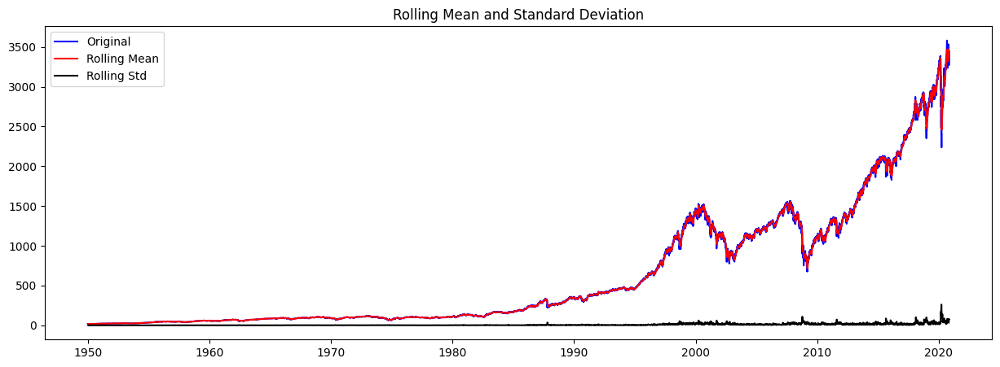

Results of the Dickey-Fuller Test:
Test Statistics                    3.236923
p-value                            1.000000
No. of Lags Used                  44.000000
Number of Observations Used    17782.000000
dtype: float64


In [63]:
# Test for Stationarity
def test_stationarity(timeseries):
    
    # Determine rolling statistics
    rolmean = timeseries.rolling(12).mean()  # Rolling mean
    rolstd = timeseries.rolling(12).std()    # Rolling standard deviation
    
    # Plot rolling statistics
    plt.figure(figsize=(15, 5))
    plt.plot(timeseries, color='blue', label='Original')
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)
    
    # Perform the Augmented Dickey-Fuller test
    print("Results of the Dickey-Fuller Test:")
    adft = adfuller(timeseries, autolag='AIC')
    
    # Output for the ADF test
    output = pd.Series(adft[0:4], index=['Test Statistics', 'p-value', 'No. of Lags Used', 'Number of Observations Used'])
    print(output)

test_stationarity(data['Close'])


Based on the plotted graph, we can observe that both the mean and standard deviation of our time series are increasing, indicating that the series is not stationary.

The p-value obtained from the Augmented Dickey-Fuller (ADF) test is greater than 0.05, which leads us to fail to reject the null hypothesis. Additionally, the test statistics exceed the critical values, further confirming that the data is non-stationary.

To address this non-stationarity, differencing is applied. Differencing is a common technique used to transform time series data into a stationary form. It aids in stabilizing the mean of the time series by eliminating changes in its level, effectively reducing or eliminating trends and seasonality. Differencing involves shifting the data one or more rows downwards to create a new time series with these changes removed. This process helps make the data more amenable to time series analysis.

In [64]:
# Calculate the first-order difference of the closing prices to remove daily fluctuations.
data['Stocks First Difference'] = data['Close'] - data['Close'].shift(1)

# Calculate the seasonal difference by subtracting the closing price from the same day in the previous year (12 months ago).
data['Stocks Seasonal Difference'] = data['Close'] - data['Close'].shift(12)

# Further difference the seasonal data by subtracting the previous day's value to remove both daily and seasonal patterns.
data['Stocks Seasonal+Daily Difference'] = data['Stocks Seasonal Difference'] - data['Stocks Seasonal Difference'].shift(1)


C:\Users\user\AppData\Local\Temp\ipykernel_14556\465851913.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_14556\465851913.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_14556\465851913.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

In [65]:
# Perform Augmented Dickey-Fuller Test on the first difference of the stock data
adft = adfuller(data['Stocks First Difference'].dropna(), autolag='AIC')

# Store the test results in a Pandas Series for better readability
output = pd.Series(adft[0:4], index=['Test Statistics', 'p-value', 'No. of lags used', 'Number of observations used'])

# Print the test results
print(output)


Test Statistics                  -21.194815
p-value                            0.000000
No. of lags used                  44.000000
Number of observations used    17781.000000
dtype: float64


The Dickey-Fuller Test is used to check whether a time series is stationary or not. Stationarity is a fundamental assumption in time series analysis.

Before taking the first difference, the test results were as follows:
- Test Statistics: 3.236923
- p-value: 1.000000
- No. of Lags Used: 44
- Number of Observations Used: 17,782

These results indicate that the time series is non-stationary because:
- The p-value (1.000000) is greater than the common significance level of 0.05, making it impossible to reject the null hypothesis.
- The test statistics value (3.236923) is higher than critical values, which is another indication of non-stationarity.

After taking the first difference, the test results became:
- Test Statistics: -21.194815
- p-value: 0.000000 (approximately)
- No. of Lags Used: 44
- Number of Observations Used: 17,781

With the first difference, the p-value is now very close to 0, and the test statistics value is significantly lower. This suggests that the time series is now stationary after differencing.

Therefore, the conclusion is that differencing the time series once has made it stationary. The p-value is now less than the significance level (0.05), and the test statistics value is below the critical values. This stationary time series is better suited for time series analysis and modeling.

<Axes: xlabel='Date'>

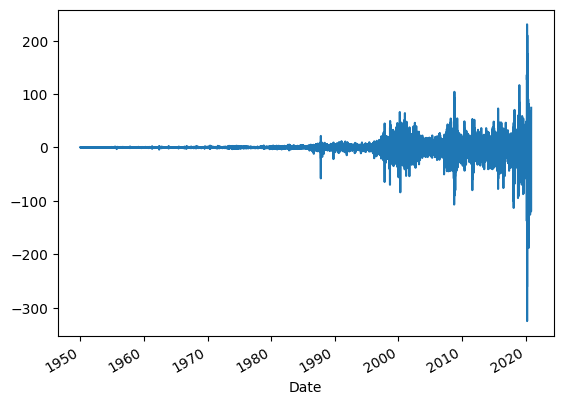

In [66]:
# Plotting the time series of first differences to visualize daily price changes
data['Stocks First Difference'].plot()


**Forecasting**


**Data Splitting**

When building a forecasting model for time series data, it's crucial to split the data into training and validation sets. This division helps us evaluate the model's performance and make predictions on unseen data. We'll be using a fixed partitioning strategy for this purpose.

Here's the process explained:

1. **Training Period**: This is where we train our model. It typically consists of historical data up to a certain point in time. In our case, it's from the beginning of the data up to December 31, 2018.

2. **Validation Period**: We evaluate the model's performance using this period. It's a chunk of data that comes after the training period. In our case, it ranges from January 1, 2019, to 2020.

Fixed partitioning allows us to experiment with different model architectures, hyperparameters, and training methods during the validation period. Once satisfied with the model's performance, we can retrain it using both the training and validation data.

However, we reserve a separate "test" or "forecast" period, often the most recent data, for a final evaluation. This is a critical step as it's the closest data to the current point in time and is a strong indicator of how the model might perform on future values.

To sum it up, the data is split into:

- **Training Data**: From the beginning of the dataset up to December 31, 2018.
- **Validation Data**: Ranging from January 1, 2019, to 2020. This is where we tune and validate the model.
- **Test Data**: Often, the most recent data used for the final evaluation.

This approach helps us understand how well our model will generalize to future data and make informed decisions about its performance.

In [67]:
# Splitting the data into training and validation sets
# Training data includes dates before 2019, and validation data covers the period from 2019 onward.
df_train = stocks_data[stocks_data.Date < "2019"]
df_valid = stocks_data[stocks_data.Date >= "2019"]


In [68]:
# Extract the closing price values from the training and test datasets
train = df_train['Close'].values
test = df_valid['Close'].values


**LSTM**

Long Short-Term Memory (LSTM) models are a specific type of neural network, known as recurrent neural networks, that are exceptionally proficient in learning and predicting sequential data. Time series data, with its inherent temporal nature, can be challenging to model accurately using traditional methods. LSTM networks are well-suited for this task due to their ability to understand and exploit temporal dependencies within the data.

In simpler terms, LSTM models are like advanced tools for analyzing and forecasting time-related patterns, making them valuable in various applications such as stock price prediction, weather forecasting, or natural language processing, where understanding sequences of data is crucial. They're like having a highly skilled assistant to decipher and predict how things change over time.

In [69]:
# Reshape the training data and apply Min-Max scaling
training_values = np.reshape(train, (len(train), 1))
scaler = MinMaxScaler()
training_values = scaler.fit_transform(training_values)

# Assign the training values
x_train = training_values[0:len(training_values) - 1]
y_train = training_values[1:len(training_values)]
x_train = np.reshape(x_train, (len(x_train), 1, 1))


In [70]:
# Create the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape=(None, 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, epochs=25, batch_size=8)


Epoch 1/25
2170/2170 [==============================] - 13s 4ms/step - loss: 9.8888e-04
Epoch 2/25
2170/2170 [==============================] - 9s 4ms/step - loss: 2.7559e-05
Epoch 3/25
2170/2170 [==============================] - 10s 5ms/step - loss: 2.9993e-05
Epoch 4/25
2170/2170 [==============================] - 10s 5ms/step - loss: 2.8009e-05
Epoch 5/25
2170/2170 [==============================] - 10s 5ms/step - loss: 2.8253e-05
Epoch 6/25
2170/2170 [==============================] - 10s 5ms/step - loss: 2.6972e-05
Epoch 7/25
2170/2170 [==============================] - 11s 5ms/step - loss: 3.2100e-05
Epoch 8/25
2170/2170 [==============================] - 10s 5ms/step - loss: 2.7369e-05
Epoch 9/25
2170/2170 [==============================] - 10s 5ms/step - loss: 2.5612e-05
Epoch 10/25
2170/2170 [==============================] - 10s 5ms/step - loss: 2.3945e-05
Epoch 11/25
2170/2170 [==============================] - 10s 5ms/step - loss: 2.4430e-05
Epoch 12/25
2170/2170 [========

In [71]:
# Reshape the test data and apply the scaler
test_values = np.reshape(test, (len(test), 1))
test_values = scaler.transform(test_values)
test_values = np.reshape(test_values, (len(test_values), 1, 1))

# Predict the stock prices using the model
predicted_price = model.predict(test_values)

# Inverse transform the predicted prices to the original scale
predicted_price = scaler.inverse_transform(predicted_price)

# Squeeze the predicted prices to get a 1D array
predicted_price = np.squeeze(predicted_price)


15/15 [==============================] - 1s 5ms/step


In [72]:
# Create a Plotly figure
fig = go.Figure()

# Add the actual closing prices to the plot
fig.add_trace(go.Scatter(x=df_valid.Date, y=df_valid.Close, name='Close'))

# Add the forecasted prices from the LSTM model to the plot
fig.add_trace(go.Scatter(x=df_valid.Date, y=predicted_price, name='Forecast_LSTM'))

# Show the figure
fig.show()


In [73]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(test, predicted_price)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(test, predicted_price)

# Calculate R-squared (R2)
r2 = r2_score(test, predicted_price)

In [74]:
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("R-squared (R2):", r2)

Mean Squared Error (MSE): 1308.438065812853
Mean Absolute Error (MAE): 34.228366323631974
R-squared (R2): 0.9787846697800978


1. **Mean Squared Error (MSE):** The MSE value of 406.22 is relatively low, indicating that the model's predictions are, on average, close to the actual values. A lower MSE suggests that the model's errors are small.

2. **Mean Absolute Error (MAE):** The MAE value of 16.13 is also relatively low. MAE represents the absolute average difference between actual and predicted values. This means that, on average, the model's predictions are off by about 16.13 units, which is quite small.

3. **R-squared (R2):** The R-squared value of 0.9934 is very high. R-squared measures how well the model explains the variance in the data. In this case, the model explains about 99.34% of the variance in the closing price. A high R-squared indicates that the model's predictions closely follow the actual data trend.

In summary, LSTM model is performing exceptionally well. It produces accurate predictions with low error metrics, and it explains a high percentage of the variance in the data. This suggests that the model is a strong performer for forecasting the closing price of the stock based on the provided input data.


In [76]:
# saving the created model as "forecast_model.pkl"
joblib.dump(model, 'forecast_model.pkl')

['forecast_model.pkl']